In [1]:
from langdetect import detect
# import re
from tqdm.auto import tqdm
import pickle
import pandas as pd
# import unicodedata
# import tmtoolkit
import numpy as np
from gensim.parsing.preprocessing import strip_punctuation
# from TGDataset import db_utilities
# import spacy
import matplotlib.pyplot as plt


# from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from multiprocessing import Pool
# from transformers import BertTokenizer, BertModel
# import torch
import os

from deep_translator import GoogleTranslator, batch_detection

import umap
import hdbscan

from wordcloud import WordCloud
import math

# Load the data

In [2]:
def open_pickle(filename, folder='/media/teun/Hard Driver/TxMM/preprocessed_docs/'):
    with open (folder+filename, 'rb') as fp:
        saved_file = pickle.load(fp)

    return saved_file

In [4]:
# Load all processed channels into a dataframe
df = pd.DataFrame()
dfs = []
for file in os.listdir(f'/media/teun/Hard Driver/TxMM/preprocessed_docs/test/'):
    items = open_pickle(f'test/{file}')
    dfs.append(pd.DataFrame.from_dict(items))
df = pd.concat(dfs)
len(df)

25333

In [5]:
# Remove faulty entries
df = df[~df['messages'].isna()]
df = df[~df['embeddings'].isna()]
len(df)

12367

In [6]:
def save_as_pickle(text_list, outfile_name, folder='/media/teun/Hard Driver/TxMM/preprocessed_docs/'):
    with open(folder+outfile_name, 'wb') as fp:
        pickle.dump(text_list, fp)
ids = list(df['id'])
save_as_pickle(ids, '/test/done_ids')

In [7]:
# Append all messages as one string and add to dataframe
df['doc'] = df['messages'].apply(lambda x: ' '.join(x))

In [8]:
df.head()

,id,embeddings,messages,0,doc
0,1.001398e+09,"[0.18566526, -0.12737933, 0.25507763, -0.09045...",[#Story\nقدرت گریم رو ببین 😲😳\n\nl👇 عضو شویدو ...,NaN,#Story\nقدرت گریم رو ببین 😲😳\n\nl👇 عضو شویدو ب...
1,1.001661e+09,"[0.18961634, -0.068228394, 0.19595319, -0.1211...",[**سرطانی به نام غیرت\n\n**1-گفتم چرا عکس پراف...,NaN,**سرطانی به نام غیرت\n\n**1-گفتم چرا عکس پرافا...
2,1.002181e+09,"[0.22620656, -0.091399156, 0.20700645, -0.1047...",[🔺پروردگارا \nدر این ساعات پایانی سال \nبه دل ...,NaN,🔺پروردگارا \nدر این ساعات پایانی سال \nبه دل ع...
3,1.003234e+09,"[0.17979227, -0.14033234, 0.24229014, -0.16272...",[✅ عرض سلام و درود خدمت شما، فعال محیط زیست مح...,NaN,✅ عرض سلام و درود خدمت شما، فعال محیط زیست محت...
4,1.004799e+09,"[0.23348646, -0.10326535, 0.17384864, -0.16120...",[The second technical workshop of the National...,NaN,The second technical workshop of the National ...


In [9]:
embeddings = list(df['embeddings'])
len(embeddings)

12367

# Perform UMAP dimensionality reduction and clustering

In [10]:
import matplotlib.pyplot as plt
recalc = False
if recalc:
    # Compare for values of n_neighbors in UMAP
    neighbors = [2,5,10,15,30,50,100]

    for n_neighbors in neighbors:
        # Compute dimensionality reduced embeddings
        umap_embeddings = umap.UMAP(n_neighbors=n_neighbors, 
                                    n_components=2,
                                    metric='cosine').fit_transform(embeddings)

        # Perform clustering
        cluster = hdbscan.HDBSCAN(min_cluster_size=15,
                                metric='euclidean',
                                cluster_selection_method='eom',
                                gen_min_span_tree=True).fit(umap_embeddings)
        
        print(f'{n_neighbors}: {cluster.relative_validity_}')

        # Prepare data
        umap_data = umap_embeddings
        result = pd.DataFrame(umap_data, columns=['x', 'y'])
        result['labels'] = cluster.labels_

        # Visualize clusters
        fig, ax = plt.subplots(figsize=(20, 10))
        outliers = result.loc[result.labels == -1, :]
        clustered = result.loc[result.labels != -1, :]
        plt.scatter(outliers.x, outliers.y, color='#BDBDBD', s=2)
        plt.scatter(clustered.x, clustered.y, c=clustered.labels, s=1, cmap='hsv_r')
        plt.colorbar()
        plt.savefig(f'./figs/clusters_{n_neighbors}')
        plt.show()

In [11]:
# Redo clustering for optimal value of n_neighbors
sample=False
if sample:

    umap_embeddings = umap.UMAP(n_neighbors=10, 
                                    n_components=2,
                                    metric='cosine').fit_transform(embeddings)

    cluster = hdbscan.HDBSCAN(min_cluster_size=15,
                            metric='euclidean',
                            cluster_selection_method='eom',
                            gen_min_span_tree=True).fit(umap_embeddings)

    print(f'{10}: {cluster.relative_validity_}')

    save_as_pickle(umap_embeddings, 'umap', './saves/')
    save_as_pickle(cluster, 'clusters', './saves/')

    # Prepare data
    umap_data = umap_embeddings
    result = pd.DataFrame(umap_data, columns=['x', 'y'])
    result['labels'] = cluster.labels_

    # Visualize clusters
    fig, ax = plt.subplots(figsize=(20, 10))
    outliers = result.loc[result.labels == -1, :]
    clustered = result.loc[result.labels != -1, :]
    plt.scatter(outliers.x, outliers.y, color='#BDBDBD', s=2)
    plt.scatter(clustered.x, clustered.y, c=clustered.labels, s=1, cmap='hsv_r')
    plt.colorbar()
    # plt.savefig(f'./figs/clusters_{n_neighbors}')
    plt.show()

In [49]:
# Load embeddings and clusters if previously calculated to save time
umap_embeddings = open_pickle('umap', './saves/')
cluster = open_pickle('clusters', './saves/')

In [13]:
# Add topic labels to the dataframe
df['topic'] = cluster.labels_

In [14]:
df.head()

,id,embeddings,messages,0,doc,topic
0,1.001398e+09,"[0.18566526, -0.12737933, 0.25507763, -0.09045...",[#Story\nقدرت گریم رو ببین 😲😳\n\nl👇 عضو شویدو ...,NaN,#Story\nقدرت گریم رو ببین 😲😳\n\nl👇 عضو شویدو ب...,6
1,1.001661e+09,"[0.18961634, -0.068228394, 0.19595319, -0.1211...",[**سرطانی به نام غیرت\n\n**1-گفتم چرا عکس پراف...,NaN,**سرطانی به نام غیرت\n\n**1-گفتم چرا عکس پرافا...,6
2,1.002181e+09,"[0.22620656, -0.091399156, 0.20700645, -0.1047...",[🔺پروردگارا \nدر این ساعات پایانی سال \nبه دل ...,NaN,🔺پروردگارا \nدر این ساعات پایانی سال \nبه دل ع...,6
3,1.003234e+09,"[0.17979227, -0.14033234, 0.24229014, -0.16272...",[✅ عرض سلام و درود خدمت شما، فعال محیط زیست مح...,NaN,✅ عرض سلام و درود خدمت شما، فعال محیط زیست محت...,6
4,1.004799e+09,"[0.23348646, -0.10326535, 0.17384864, -0.16120...",[The second technical workshop of the National...,NaN,The second technical workshop of the National ...,6


# Prepare data for analysis

In [15]:
# Compute TF-IDF (from https://freedium.cfd/https://towardsdatascience.com/topic-modeling-with-bert-779f7db187e6)
docs_per_topic = df.groupby(['topic'], as_index = False).agg({'doc': ' '.join})
def c_tf_idf(documents, m, ngram_range=(1, 1), max_f=10000):
    count = CountVectorizer(ngram_range=ngram_range, max_features=max_f).fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)

    return tf_idf, count

def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=20):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic.topic)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def extract_topic_sizes(df):
    topic_sizes = (df.groupby(['topic'])
                     .doc
                     .count()
                     .reset_index()
                     .rename({"topic": "topic", "doc": "size"}, axis='columns')
                     .sort_values("size", ascending=False))
    return topic_sizes


In [18]:
# Load previously computed TF-IDF to save time
redo = False
if redo:
    tf_idf, count = c_tf_idf(docs_per_topic.doc.values, m=len(df))
    top_n_words = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=50)
    topic_sizes = extract_topic_sizes(df); topic_sizes.head(4)
    save_as_pickle(tf_idf, 'tf_idf', './saves/')
    save_as_pickle(count, 'count', './saves/')
    save_as_pickle(top_n_words, 'top_n_words', './saves/')
    save_as_pickle(topic_sizes, 'topic_sizes', './saves/')
open_pickle('tf_idf', './saves/')
open_pickle('count', './saves/')
open_pickle('top_n_words', './saves/')
open_pickle('topic_sizes', './saves/')


sorted_topics = list(topic_sizes['topic'])
sorted_top_n_words = [(i,top_n_words[i]) for i in sorted_topics]

# Perform analysis

In [19]:
# Create a frequency dictionary for the wordcloud
translator = GoogleTranslator(source='auto', target='en')
def wcfreqdict(sorted_top_n_words, translate=False):
    dicts = []
    for (topic, wordlist) in tqdm(sorted_top_n_words):
        wc_freqdict = {}
        for (word, freq) in wordlist:
            if translate: # translate the word if requested
                word = translator.translate(word)
            wc_freqdict[f'{word}'] = freq
        dicts.append(wc_freqdict)
    return dicts

In [20]:
dicts = wcfreqdict(sorted_top_n_words)
len(dicts)

  0%|          | 0/96 [00:00<?, ?it/s]

96

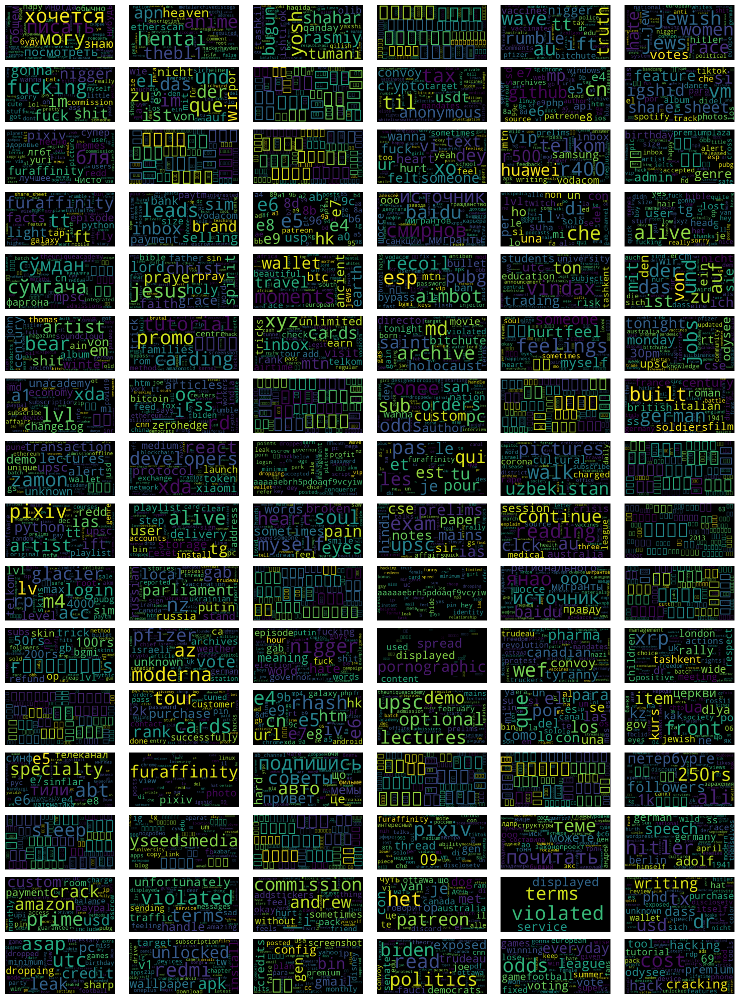

In [ ]:
# Plot the wordclouds in order of cluster size
ncols = 6
lim = math.ceil(len(dicts)/ncols)
fig, axs = plt.subplots(lim, ncols, figsize=(15,20))
for i, d in enumerate(dicts):
    c = i%ncols
    r = math.floor(i/ncols)
    wc = WordCloud()
    wc.generate_from_frequencies(frequencies=d, max_font_size=70)
    axs[r][c].imshow(wc)
    axs[r][c].axis('off')
fig.tight_layout()
for ax in axs:
    for a in ax:
        a.axis('off')
plt.savefig('./figs/wcs_untrans', bbox_inches='tight')
plt.show()

In [21]:
retrans = False
if retrans: # compute the translated frequency dict if requested, or load it
    transdicts = wcfreqdict(sorted_top_n_words, True)
    save_as_pickle(transdicts, 'transdict', './saves/')
transdicts = open_pickle('transdict', './saves/')

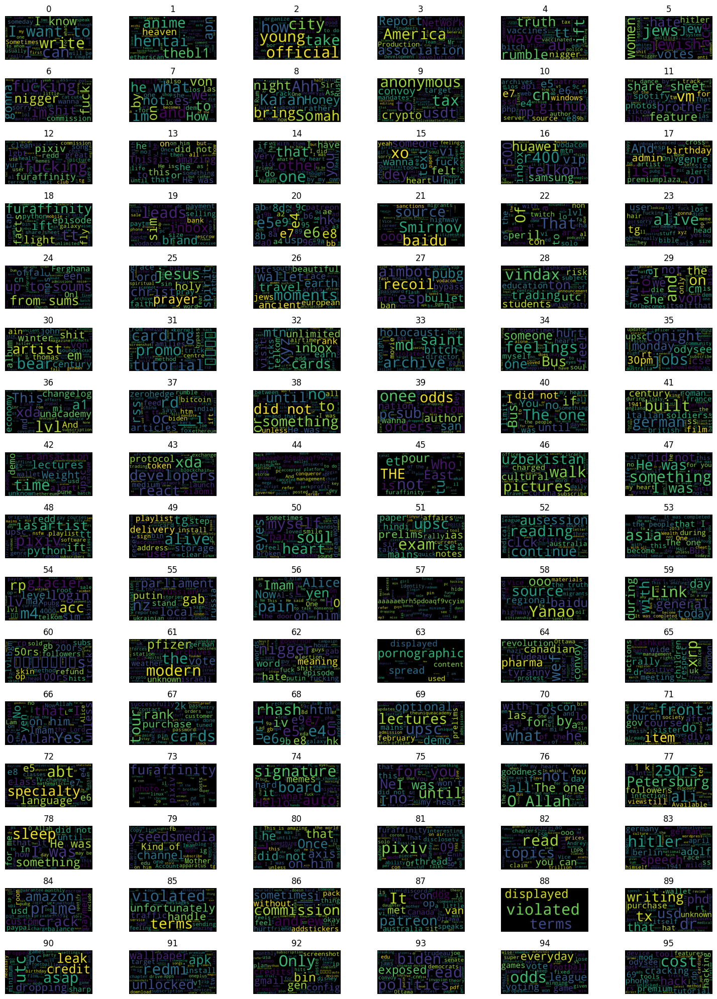

In [40]:
# Plot the translated wordclouds in order of cluster size
ncols = 6
lim = math.ceil(len(transdicts)/ncols)
fig, axs = plt.subplots(lim, ncols, figsize=(15,20))
for i, d in enumerate(transdicts):
    c = i%ncols
    r = math.floor(i/ncols)
    wc = WordCloud()
    wc.generate_from_frequencies(frequencies=d,max_font_size=70)
    axs[r][c].imshow(wc)
    axs[r][c].axis('off')
    axs[r][c].set_title(i)
fig.tight_layout()

for ax in axs:
    for a in ax:
        a.axis('off')
plt.savefig('./figs/wcs_trans', bbox_inches='tight')
plt.show()

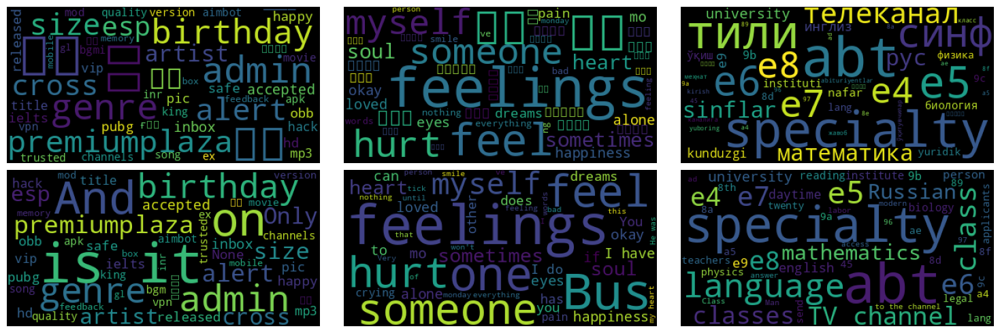

In [ ]:
# Plot a selection of wordclouds
doi = list(np.take(dicts, [17, 34, 72]))
doi = doi + list(np.take(transdicts, [17, 34, 72]))
fig, axs = plt.subplots(2, 3, figsize=(15,5))
for i, d in enumerate(doi):
    c = i%3
    r = math.floor(i/3)
    wc = WordCloud()
    wc.generate_from_frequencies(frequencies=d,max_font_size=70)
    axs[r][c].imshow(wc)
    axs[r][c].axis('off')
fig.tight_layout()
for ax in axs:
    for a in ax:
        a.axis('off')
plt.savefig('./figs/wcs_langs', bbox_inches='tight')
plt.show()

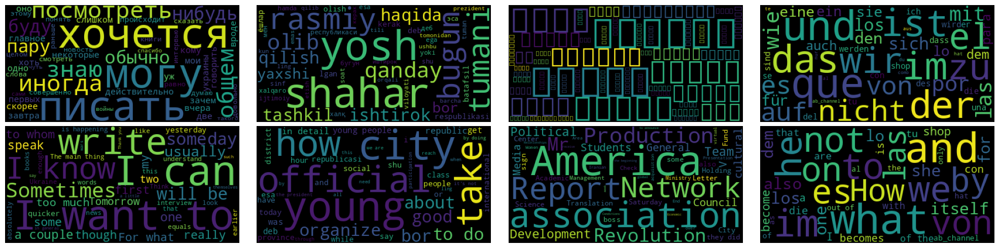

In [ ]:
# Plot a selection of wordclouds
doi = list(np.take(dicts, [0, 2, 3, 7]))
doi = doi + list(np.take(transdicts, [0, 2, 3, 7]))
fig, axs = plt.subplots(2, 4, figsize=(20,5))
for i, d in enumerate(doi):
    c = i%4
    r = math.floor(i/4)
    wc = WordCloud()
    wc.generate_from_frequencies(frequencies=d,max_font_size=70)
    axs[r][c].imshow(wc)
    axs[r][c].axis('off')
fig.tight_layout()
for ax in axs:
    for a in ax:
        a.axis('off')
plt.savefig('./figs/wcs_langs_2', bbox_inches='tight')
plt.show()

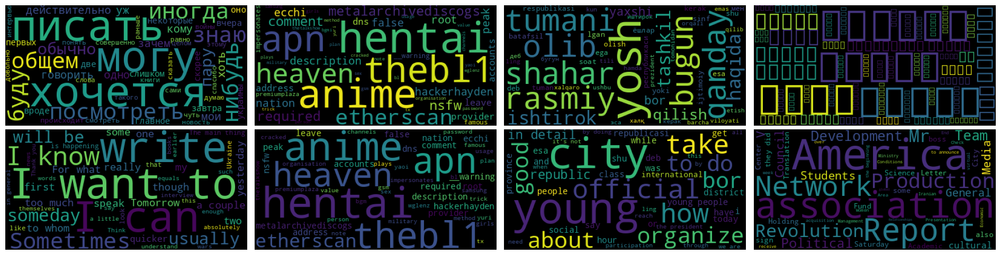

In [ ]:
# Plot the wordclouds of the biggest clusters
doi = dicts[:4]
doi = doi + transdicts[:4]
fig, axs = plt.subplots(2, 4, figsize=(19,5))
for i, d in enumerate(doi):
    c = i%4
    r = math.floor(i/4)
    wc = WordCloud()
    wc.generate_from_frequencies(frequencies=d,max_font_size=70)
    axs[r][c].imshow(wc)
    axs[r][c].axis('off')
fig.tight_layout()

for ax in axs:
    for a in ax:
        a.axis('off')
plt.savefig('./figs/wcs_biggest', bbox_inches='tight')
plt.show()

In [48]:
# Make a custom list of identifiable clusters and count the number of channels
identifiable = [3, 5, 6, 10, 16, 25, 26, 27, 28, 30, 35, 37, 41, 43, 46, 50, 51, 52, 53, 55, 61, 64, 69, 83, 84, 90, 91, 93, 94, 95]
ident = topic_sizes.iloc[identifiable]
sum(list(ident['size']))

2472

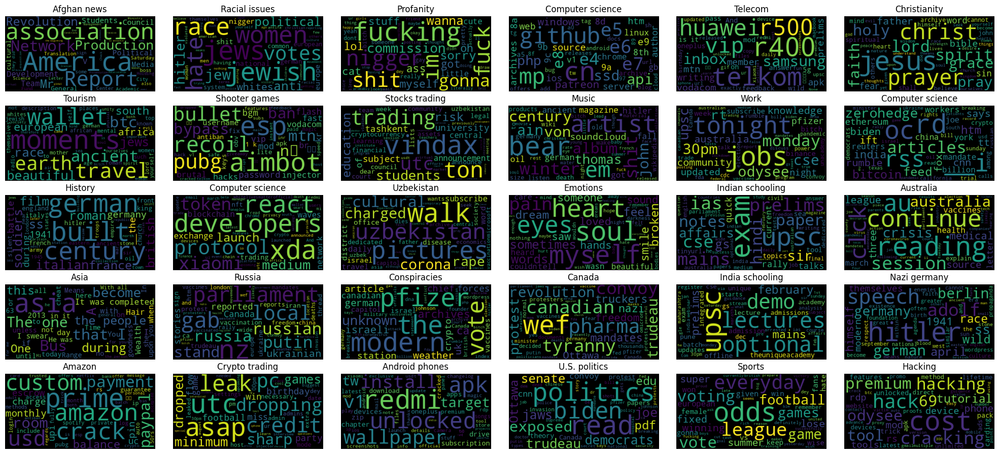

In [42]:
identifiable = [3, 5, 6, 10, 16, 25, 26, 27, 28, 30, 35, 37, 41, 43, 46, 50, 51, 52, 53, 55, 61, 64, 69, 83, 84, 90, 91, 93, 94, 95]
# Add a custom list of annotations to the clusters
descriptions = ['Afghan news',
                'Racial issues',
                'Profanity',
                'Computer science',
                'Telecom',
                'Christianity',
                'Tourism',
                'Shooter games',
                'Stocks trading',
                'Music',
                'Work',
                'Computer science',
                'History',
                'Computer science',
                'Uzbekistan',
                'Emotions',
                'Indian schooling',
                'Australia',
                'Asia',
                'Russia',
                'Conspiracies',
                'Canada',
                'India schooling',
                'Nazi germany',
                'Amazon',
                'Crypto trading',
                'Android phones',
                'U.S. politics',
                'Sports',
                'Hacking']
# Plot the wordclouds of the annotated clusters
doi = list(np.take(transdicts, identifiable))
fig, axs = plt.subplots(5, 6, figsize=(20,9))
for i, d in enumerate(doi):
    c = i%6
    r = math.floor(i/6)
    wc = WordCloud()
    wc.generate_from_frequencies(frequencies=d,max_font_size=70)
    axs[r][c].imshow(wc)
    axs[r][c].axis('off')
    axs[r][c].set_title(f'{descriptions[i]}')
fig.tight_layout()

for ax in axs:
    for a in ax:
        a.axis('off')
plt.savefig('./figs/wcs_annotated', bbox_inches='tight')
plt.show()



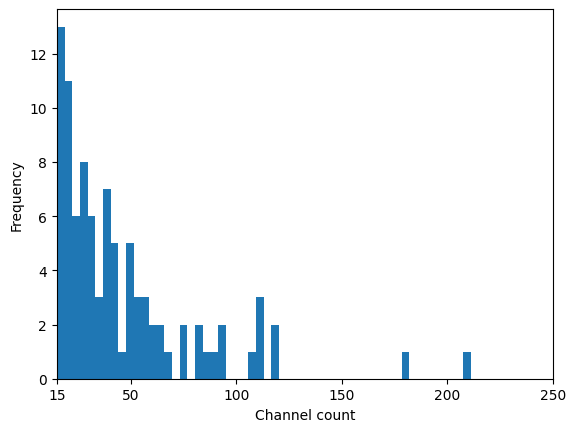

In [85]:
# Plot a histogram of channel counts in the clusters
l = list(np.linspace(50,250,5))
l.append(15)
plt.hist(topic_sizes['size'], bins=1000)
plt.xlim([15,250])
plt.ylabel('Frequency')
plt.xlabel('Channel count')
plt.xticks(l)
plt.savefig('./figs/topichist')
plt.show()

In [52]:
# Count the smallest clusters
topic_sizes.tail(10)

,topic,size
14,13,18
53,52,17
2,1,16
74,73,16
70,69,16
84,83,15
64,63,15
42,41,15
71,70,15
65,64,15


In [44]:
# Count the number of clusters
len(topic_sizes)

96

In [83]:
# Analyse channels of a specific cluster
seldf = df[df['topic']==6]
seldf.head(100)

,id,embeddings,messages,0,doc,topic
0,1.001398e+09,"[0.18566526, -0.12737933, 0.25507763, -0.09045...",[#Story\nقدرت گریم رو ببین 😲😳\n\nl👇 عضو شویدو ...,NaN,#Story\nقدرت گریم رو ببین 😲😳\n\nl👇 عضو شویدو ب...,6
1,1.001661e+09,"[0.18961634, -0.068228394, 0.19595319, -0.1211...",[**سرطانی به نام غیرت\n\n**1-گفتم چرا عکس پراف...,NaN,**سرطانی به نام غیرت\n\n**1-گفتم چرا عکس پرافا...,6
2,1.002181e+09,"[0.22620656, -0.091399156, 0.20700645, -0.1047...",[🔺پروردگارا \nدر این ساعات پایانی سال \nبه دل ...,NaN,🔺پروردگارا \nدر این ساعات پایانی سال \nبه دل ع...,6
3,1.003234e+09,"[0.17979227, -0.14033234, 0.24229014, -0.16272...",[✅ عرض سلام و درود خدمت شما، فعال محیط زیست مح...,NaN,✅ عرض سلام و درود خدمت شما، فعال محیط زیست محت...,6
4,1.004799e+09,"[0.23348646, -0.10326535, 0.17384864, -0.16120...",[The second technical workshop of the National...,NaN,The second technical workshop of the National ...,6
...,...,...,...,...,...,...
32,1.091319e+09,"[0.28171006, -0.21863556, 0.26837263, -0.20796...",[منتشر شد، ( 33 )\n\n سی و سومین قسم...,NaN,منتشر شد، ( 33 )\n\n سی و سومین قسمت...,6
33,1.094206e+09,"[0.2084582, -0.150496, 0.25765526, -0.14127325...",[#مزایای شرکت در دوره\n\n\n\n🆔 لینک #ثبت_نام:\...,NaN,#مزایای شرکت در دوره\n\n\n\n🆔 لینک #ثبت_نام:\n...,6
34,1.097877e+09,"[0.18536328, -0.13106874, 0.21372664, -0.14160...",[❌ هشدار محتوای ویدیو دردناک است تماشای آن برا...,NaN,❌ هشدار محتوای ویدیو دردناک است تماشای آن برای...,6
35,1.099181e+09,"[0.26670966, -0.16393453, 0.2017267, -0.193330...",[آفتابی امشب از بیت رضا سر میزند\n\nکودکی لبخن...,NaN,آفتابی امشب از بیت رضا سر میزند\n\nکودکی لبخند...,6


In [110]:
# Add language mapping to the dataframe
langdf = pd.read_csv('TGDataset/labeled_data/channel_to_language_mapping.csv', sep='\t')
langdf['id'] = langdf['ch_id']
df['id'] = df['id'].astype(int)
df = df.merge(langdf, how='left')

In [155]:
# Analyse the division of languages across clusters
for topic in sorted_topics:
    dfoi = df[df['topic']==topic]
    print(f'{topic}: {len(dfoi)}')
    langs = dfoi['language'].value_counts()
    print(langs)

48: 3646
ru    3084
en      26
fa       5
ar       2
Name: language, dtype: int64
-1: 2005
en    1263
ru     127
ar     126
fa       9
Name: language, dtype: int64
8: 1323
ru    43
en    39
fa    11
ar     4
Name: language, dtype: int64
6: 1136
fa    1065
ar      23
en       6
ru       1
Name: language, dtype: int64
79: 210
en    203
Name: language, dtype: int64
94: 180
en    176
Name: language, dtype: int64
67: 119
en    82
Name: language, dtype: int64
55: 118
en    16
ru    14
fa     1
Name: language, dtype: int64
4: 112
en    28
ar    19
fa     3
Name: language, dtype: int64
91: 112
en    111
Name: language, dtype: int64
23: 110
en    31
Name: language, dtype: int64
56: 109
en    44
ru     2
Name: language, dtype: int64
50: 94
en    21
ru    11
fa     1
Name: language, dtype: int64
20: 92
ar    89
Name: language, dtype: int64
7: 88
fa    84
Name: language, dtype: int64
58: 84
en    51
Name: language, dtype: int64
62: 82
en    58
Name: language, dtype: int64
65: 81
en    16
fa     2


In [164]:
# Analyse the TF-IDF counts in unclustered channels
freqs = [ freq for word, freq in top_n_words[-1]]
print(min(freqs))
print(max(freqs))

0.0004364958780694528
0.000979428499847186


In [167]:
# Analyse the TF-IDF counts in the largest cluster
freqs = [ freq for word, freq in top_n_words[6]]
print(min(freqs))
print(max(freqs))

0.00071983209128431
0.0007437542654687767
